In [3]:
# Setup code for the notebook
%matplotlib notebook
# Autoreload external python modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt

from ipytools import display_imshow
from ipytools import readGTIFF
from ipytools import writeGTIFF
from ipytools import readGTIFFmeta
from ipytools import display_gallery
from ipytools import display_RSO

from glob import glob
from tqdm import tqdm
import json
import numpy as np

# Tools to handle S03
from tools import s03_handler
from tools import data_handler
from tools import write_json

# # RPC class
# from rpc_model import RPCModel

# from tools import get_image_longlat_polygon
# from tools import reprojection
# from tools import geolocalisation

# SIFT detector
# from ..s2plib.sift import matches_on_rpc_roi
import cv2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Reset matplotlib theme
res = %env
if res['USER'] == "vmatthys":
    # import jtplot module in notebook
    from jupyterthemes import jtplot
    # reset default matplotlib rcParams
    jtplot.reset()

ModuleNotFoundError: No module named 'jupyterthemes'

# Data handler

In [125]:
lst_tif, area, triplets = s03_handler()

In [126]:
triplets['1Z']['d1'][2]

'../data/s03_20161003T161231Z/panchromatic/s03_20161003T161231Z_pan_d1_0002.tif'

In [256]:
roi = {
    "x": 1300,
    "y": 400,
    "w": 800,
    "h": 800
}
# roi = {
#     "x": 1067,
#     "y": 0,
#     "w": 1067,
#     "h": 1349
# }
x, y, w, h = roi["x"], roi["y"], roi["w"], roi["h"]

In [257]:
# Sift study
A = area['d1'][2]
A

{'1Z': '../data/s03_20161003T161231Z/panchromatic/s03_20161003T161231Z_pan_d1_0002.tif',
 '7Z': '../data/s03_20161003T161107Z/panchromatic/s03_20161003T161107Z_pan_d1_0002.tif',
 '8Z': '../data/s03_20161003T161148Z/panchromatic/s03_20161003T161148Z_pan_d1_0002.tif'}

In [258]:
from matplotlib.patches import Ellipse, Polygon

<IPython.core.display.Javascript object>


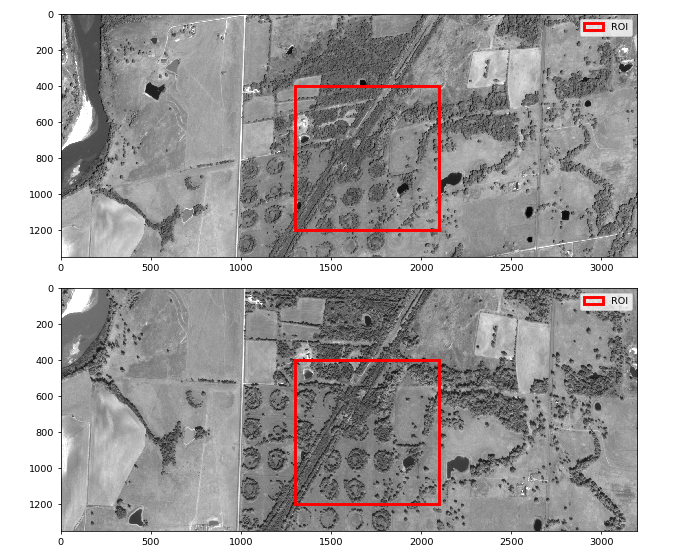

In [261]:
f, ax = plt.subplots(2, figsize = (10, 8))
ax[0].imshow(display_RSO(readGTIFF(A['1Z']), plot=False)[:, :, 0], cmap="gray")
ax[0].add_patch(Polygon([[x,y],[x+w, y], [x+w, y+h], [x, y + h]], closed=True, fill=False, lw = 3, color = "red", label = "ROI"))
ax[0].legend()
ax[1].imshow(display_RSO(readGTIFF(A['8Z']), plot=False)[:, :, 0], cmap="gray")
ax[1].add_patch(Polygon([[x,y],[x+w, y], [x+w, y+h], [x, y + h]], closed=True, fill=False, lw = 3, color = "red", label = "ROI"))
ax[1].legend()
plt.tight_layout()
plt.savefig("/tmp/ROI_d1_2.jpeg")
plt.show()

In [262]:
im_1, im_2 = display_RSO(readGTIFF(A['1Z'])[y:y+h, x:x+w], plot=False), display_RSO(readGTIFF(A['8Z'])[y:y+h, x:x+w], plot=False)
writeGTIFF(im_1, "tmp/asift_1.tif")
writeGTIFF(im_2, "tmp/asift_2.tif")
new_img = np.hstack((im_1, im_2))

writeGTIFF: driver override from PNG to GTiff
writeGTIFF: changing the size of the GeoTIFF
writeGTIFF: driver override from PNG to GTiff
writeGTIFF: changing the size of the GeoTIFF


<IPython.core.display.Javascript object>


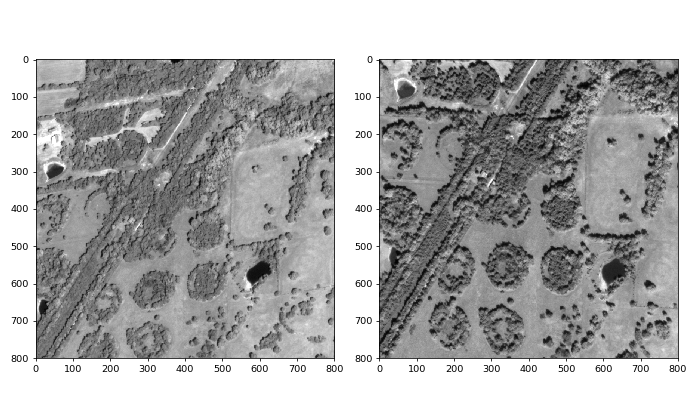

In [263]:
f, ax = plt.subplots(1, 2, figsize = (10, 6))
ax[0].imshow(im_1[:, :, 0], cmap = "gray")
ax[1].imshow(im_2[:, :, 0], cmap = "gray")
plt.tight_layout()
# plt.savefig("/tmp/c")
plt.show()


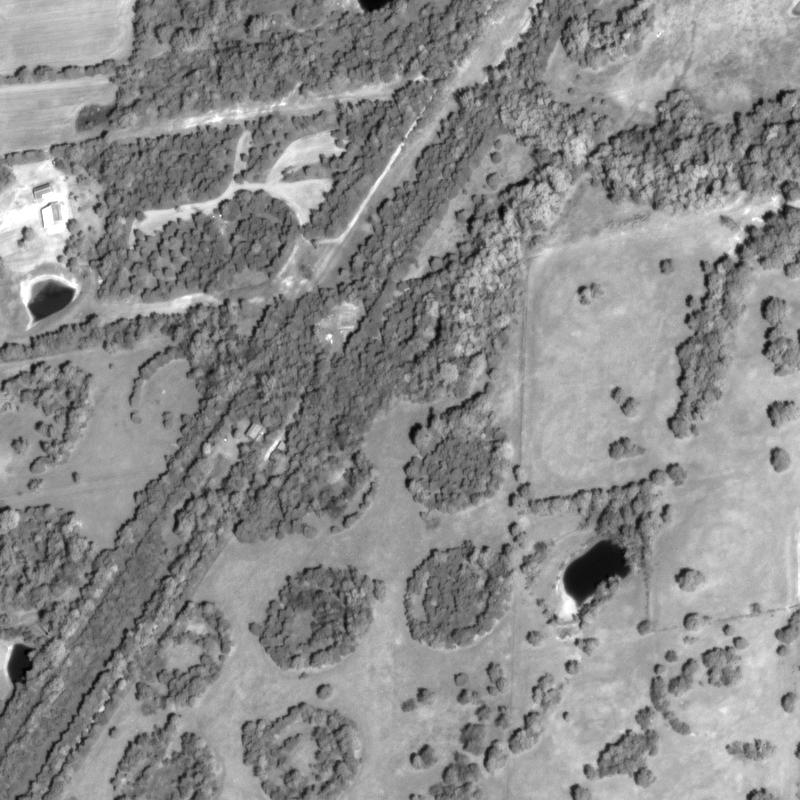
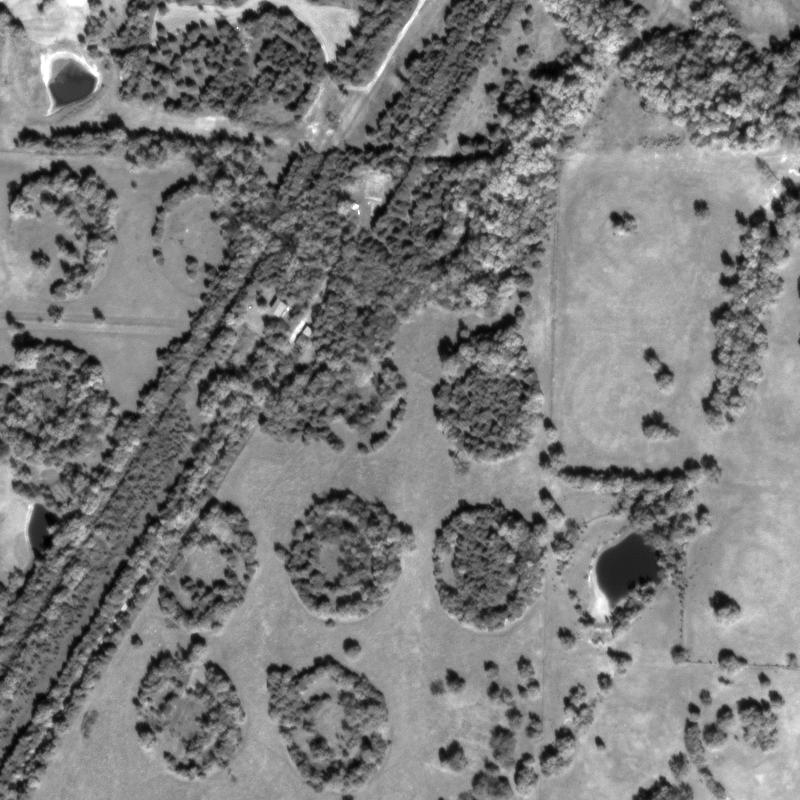

In [264]:
display_gallery([display_RSO(readGTIFF(A['1Z'])[y:y+h, x:x+w], plot=False),
                display_RSO(readGTIFF(A['8Z'])[y:y+h, x:x+w], plot=False)])

In [265]:
duet = [
    A['1Z'],
    A['8Z']
]

In [266]:
duet

['../data/s03_20161003T161231Z/panchromatic/s03_20161003T161231Z_pan_d1_0002.tif',
 '../data/s03_20161003T161148Z/panchromatic/s03_20161003T161148Z_pan_d1_0002.tif']

In [267]:
write_json(duet, roi)

# ASIFT by OPENCV

## Write specific tiff

In [12]:
help (writeGTIFF)

Help on function writeGTIFF in module ipytools:

writeGTIFF(im, fname, copy_metadata_from=None)
    Writes a numpy array to a GeoTIFF, PNG, or JPEG image depending on fname extension.
    For GeoTIFF files the metadata can be copied from another file.
    Note that if  im  and  copy_metadata_from have different size,
    the copied geolocation properties are not adapted.



In [212]:
s2p_matches

array([[1120.2  ,   61.217, 1090.36 ,   21.834],
       [1120.2  ,   61.217, 1090.36 ,   21.834],
       [1131.51 ,    6.981, 1090.36 ,   21.834],
       [1130.6  ,   15.294, 1090.36 ,   21.834],
       [1128.6  ,   19.337, 1090.36 ,   21.834],
       [1107.09 ,  125.755, 1090.36 ,   21.834],
       [1095.07 ,  174.087, 1090.36 ,   21.834],
       [1095.07 ,  174.087, 1090.36 ,   21.834],
       [1144.65 ,  453.528, 1173.09 ,  129.891],
       [1078.91 ,  247.276, 1090.36 ,   21.834],
       [1076.29 ,  259.974, 1090.36 ,   21.834],
       [1123.43 ,  793.873, 1155.65 ,  542.826],
       [1230.04 ,  882.581, 1343.58 ,  285.762],
       [2094.03 ,  974.944, 2157.66 ,  953.005],
       [1113.94 ,   89.295, 1090.36 ,   21.834],
       [1110.12 ,  108.164, 1090.36 ,   21.834],
       [1110.12 ,  108.164, 1090.36 ,   21.834],
       [1108.   ,  116.62 , 1090.36 ,   21.834],
       [1080.09 ,  239.192, 1090.36 ,   21.834],
       [1132.47 ,   11.474, 1090.36 ,   21.834],
       [1110.12 ,  1

In [222]:
s2p_matches = np.loadtxt("sift_output/tiles/row_0000000_height_1349/col_0001067_width_1067/pair_1/sift_matches.txt")
matches = np.loadtxt("sift/d1_2/match_ASIFT.txt", skiprows=1)
s2p_p1 = s2p_matches[:, :2] - (x, y)
s2p_p2 = s2p_matches[:, 2:] - (x, y)  + (im_1.shape[1], 0)
p1 = matches[:, :2]
p2 = matches[:, 2:] + (im_1.shape[1], 0)

## Convert Asift matches for S2P

In [255]:
for_s2p_p1 = p1 + (x,y)
for_s2p_p2 = p1 + (x,y)
np.savetxt("sift/d1_2/for_s2p.txt", np.hstack((for_s2p_p1, for_s2p_p2)))

In [230]:
len(s2p_matches)

25

<IPython.core.display.Javascript object>


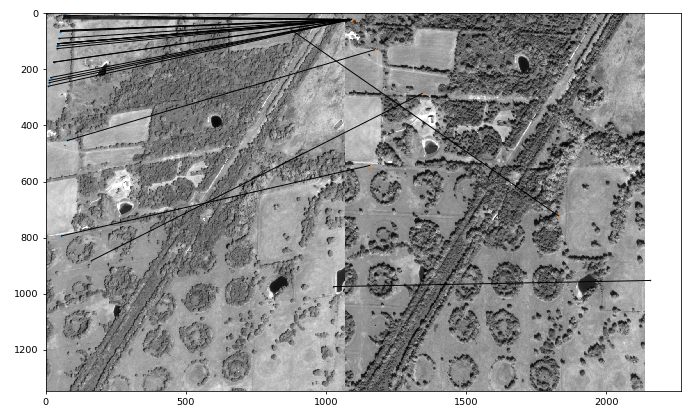

In [227]:
plt.figure(figsize=(10,6))
plt.imshow(new_img[:, :, 0], cmap="gray")
plt.scatter(s2p_p1[:, 0], s2p_p1[:, 1], s = 1)
plt.scatter(s2p_p2[:, 0], s2p_p2[:, 1], s = 1)
for i in range(min(len(s2p_p1), 50)):
    plt.plot([s2p_p1[i, 0], s2p_p2[i, 0]], [s2p_p1[i, 1], s2p_p2[i, 1]],
             color = "black",
             lw = 1)
plt.tight_layout()
plt.savefig("/tmp/sift_s2p_d1_2.jpeg")
plt.show()

In [231]:
len(matches)

2256

<IPython.core.display.Javascript object>


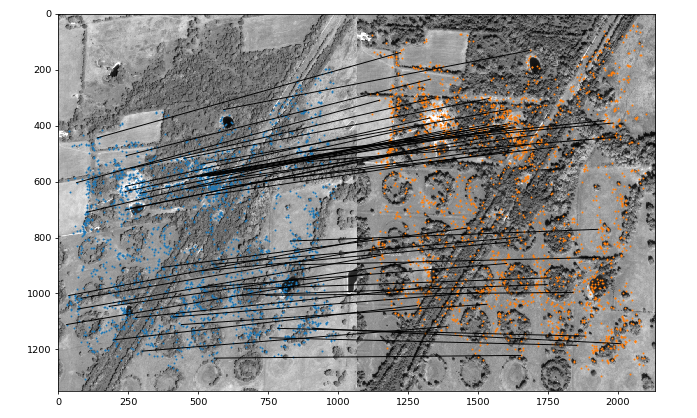

In [228]:
plt.figure(figsize=(10,6))
plt.imshow(new_img[:, :, 0], cmap="gray")
plt.scatter(p1[:, 0], p1[:, 1], s = 1)
plt.scatter(p2[:, 0], p2[:, 1], s = 1)
for i in range(min(len(p1), 50)):
    plt.plot([p1[i, 0], p2[i, 0]], [p1[i, 1], p2[i, 1]],
             color = "black",
             lw = 1)
plt.tight_layout()
plt.savefig("/tmp/asift_cv_d1_2.jpeg")
plt.show()

In [122]:
plt.figure()
plt.imshow

array([[ 534.468,  343.027],
       [ 941.577, 1179.37 ],
       [ 472.659,  303.161],
       ...,
       [ 162.337, 1078.37 ],
       [ 719.274,  732.934],
       [ 471.902,  306.212]])

# SIFT by OPEN CV

In [45]:
img1 = cv2.imread("tmp/asift_1.tif",0)          # queryImage
img2 = cv2.imread("tmp/asift_2.tif",0) # trainImage

# Initiate SIFT detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

In [242]:
def draw_matches(img1, kp1, img2, kp2, matches, color=None, save = None): 
    """Draws lines between matching keypoints of two images.  
    Keypoints not in a matching pair are not drawn.
    Places the images side by side in a new image and draws circles 
    around each keypoint, with line segments connecting matching pairs.
    You can tweak the r, thickness, and figsize values as needed.
    Args:
        img1: An opencv2 image ndarray in a grayscale or color format.
        kp1: A list of cv22.KeyPoint objects for img1.
        img2: An opencv2 image ndarray of the same format and with the same 
        element type as img1.
        kp2: A list of cv22.KeyPoint objects for img2.
        matches: A list of DMatch objects whose trainIdx attribute refers to 
        img1 keypoints and whose queryIdx attribute refers to img2 keypoints.
        color: The color of the circles and connecting lines drawn on the images.  
        A 3-tuple for color images, a scalar for grayscale images.  If None, these
        values are randomly generated.  
    """
    # We're drawing them side by side.  Get dimensions accordingly.
    # Handle both color and grayscale images.
    if len(img1.shape) == 3:
        new_shape = (max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1], img1.shape[2])
    elif len(img1.shape) == 2:
        new_shape = (max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1])
    new_img = np.zeros(new_shape, type(img1.flat[0]))  
    # Place images onto the new image.
    new_img[0:img1.shape[0],0:img1.shape[1]] = img1
    new_img[0:img2.shape[0],img1.shape[1]:img1.shape[1]+img2.shape[1]] = img2
    
    # Draw lines between matches.  Make sure to offset kp coords in second image appropriately.
    r = 2
    thickness = 3
    if color:
        c = color
    for m in matches:
        # Generate random color for RGB/BGR and grayscale images as needed.
        if not color:
            c = 0
#             c = np.random.randint(0,256,3) if len(img1.shape) == 3 else np.random.randint(0,256)
        # So the keypoint locs are stored as a tuple of floats.  cv22.line(), like most other things,
        # wants locs as a tuple of ints.
        end1 = tuple(np.round(kp1[m.trainIdx].pt).astype(int))
        end2 = tuple(np.round(kp2[m.queryIdx].pt).astype(int) + np.array([img1.shape[1], 0]))
        cv2.line(new_img, end1, end2, c, thickness)
        cv2.circle(new_img, end1, r, c, thickness)
        cv2.circle(new_img, end2, r, c, thickness)
    
    plt.figure(figsize=(10,6))
    plt.imshow(new_img, cmap = "gray")
    plt.tight_layout()
    if save is not None:
        plt.savefig(save)
plt.show()

In [232]:
draw_matches(img1,kp1,img2,kp2,matches, color="black")

AttributeError: 'numpy.ndarray' object has no attribute 'trainIdx'

In [50]:
matches[0].

[<DMatch 0x7f678e0b07d0>,
 <DMatch 0x7f678e0adf70>,
 <DMatch 0x7f678e0b0190>,
 <DMatch 0x7f678e0ad310>,
 <DMatch 0x7f678e0b07f0>,
 <DMatch 0x7f678e0ad410>,
 <DMatch 0x7f678e0abd50>,
 <DMatch 0x7f678e0b0210>,
 <DMatch 0x7f678e0ad490>,
 <DMatch 0x7f678e0b02f0>,
 <DMatch 0x7f678e0af0f0>,
 <DMatch 0x7f678e0ad1d0>,
 <DMatch 0x7f678e0ad390>,
 <DMatch 0x7f678e0b0bb0>,
 <DMatch 0x7f678e0b0e30>,
 <DMatch 0x7f678e0b01d0>,
 <DMatch 0x7f678e0b05f0>,
 <DMatch 0x7f678e0b0d50>,
 <DMatch 0x7f678e0add10>,
 <DMatch 0x7f678e0af110>,
 <DMatch 0x7f678e0b0470>,
 <DMatch 0x7f678e0ad830>,
 <DMatch 0x7f678e0adab0>,
 <DMatch 0x7f678e0b04d0>,
 <DMatch 0x7f678e0b06f0>,
 <DMatch 0x7f678e0b0e90>,
 <DMatch 0x7f678e0b02b0>,
 <DMatch 0x7f678e0b0d90>,
 <DMatch 0x7f678e0b0df0>,
 <DMatch 0x7f678e0ad3b0>,
 <DMatch 0x7f678e0ad6d0>,
 <DMatch 0x7f678e0ad950>,
 <DMatch 0x7f678e0addd0>,
 <DMatch 0x7f678e0ad530>,
 <DMatch 0x7f678e0ada30>,
 <DMatch 0x7f678e0b07b0>,
 <DMatch 0x7f678e0af030>,
 <DMatch 0x7f678e0ad330>,
 <DMatch 0x7

In [233]:
img1 = cv2.imread("tmp/asift_1.tif",0)          # queryImage
img2 = cv2.imread("tmp/asift_2.tif",0) # trainImage

# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

In [234]:
matches[0][0]

<DMatch 0x7f678c4fe710>

In [235]:
# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.5*n.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 0)

In [247]:
len(np.array(matches)[:, 0][np.array(matchesMask)[:, 0] >= 1])

25

<IPython.core.display.Javascript object>


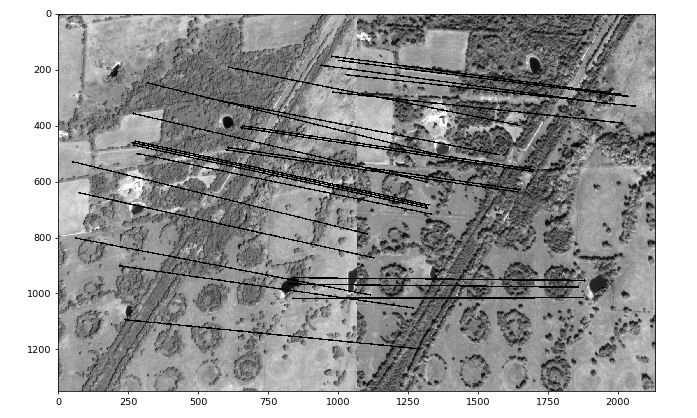

In [248]:
draw_matches(img1,kp2,img2,kp1,np.array(matches)[:, 0][np.array(matchesMask)[:, 0] >= 1], color = 0, save="/tmp/sift_cv_d1_2.jpeg")

In [246]:
len(matchesMask)

14941

<IPython.core.display.Javascript object>


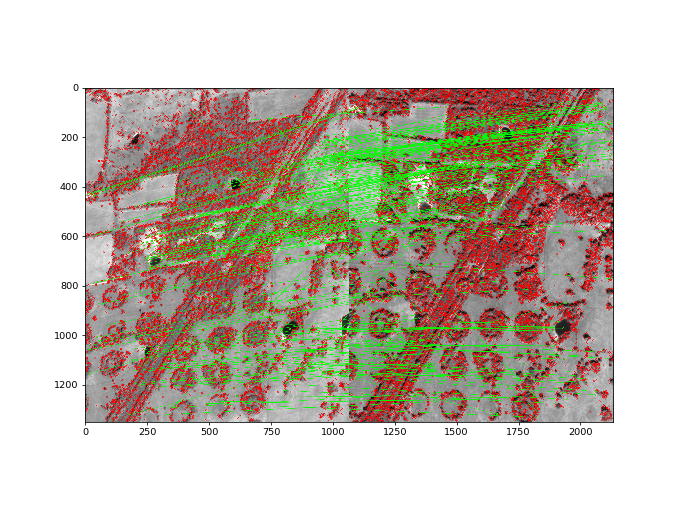

(<matplotlib.image.AxesImage at 0x7f678feaa6a0>, None)

In [14]:
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,**draw_params)

plt.imshow(img3,),plt.show()

In [16]:
help (cv.drawMatches)

Help on built-in function drawMatches:

drawMatches(...)
    drawMatches(img1, keypoints1, img2, keypoints2, matches1to2, outImg[, matchColor[, singlePointColor[, matchesMask[, flags]]]]) -> outImg
    .   @brief Draws the found matches of keypoints from two images.
    .   
    .   @param img1 First source image.
    .   @param keypoints1 Keypoints from the first source image.
    .   @param img2 Second source image.
    .   @param keypoints2 Keypoints from the second source image.
    .   @param matches1to2 Matches from the first image to the second one, which means that keypoints1[i]
    .   has a corresponding point in keypoints2[matches[i]] .
    .   @param outImg Output image. Its content depends on the flags value defining what is drawn in the
    .   output image. See possible flags bit values below.
    .   @param matchColor Color of matches (lines and connected keypoints). If matchColor==Scalar::all(-1)
    .   , the color is generated randomly.
    .   @param singlePointColo

# Analyse Sifts

In [20]:
import numpy as np

In [15]:
def analyse_sift(out_dir = "output/", save_dir = "sift/", keys = ["matches", "matches_disp"]):
    """
    Input:
    ------
    keys: list of str
          list of different files containing sifts
    """
    d = {}
    with open('config.json', 'r') as f:
        user_cfg = json.load(f)
        img = user_cfg['images'][0]['img'].split("/")[-1]
        print (img)
        d[img] = {'matches': None, "matches_disp": None}
    matches = glob(out_dir + "**/sift_matches.txt", recursive=True)
    matches_disp = glob(out_dir + "**/sift_matches_disp.txt", recursive=True)
#     if not os.path.exists(img):
#         os.makedirs(img)
    for m in keys:
        for f in m:
            d[img][m] = len(np.loadtxt(f))

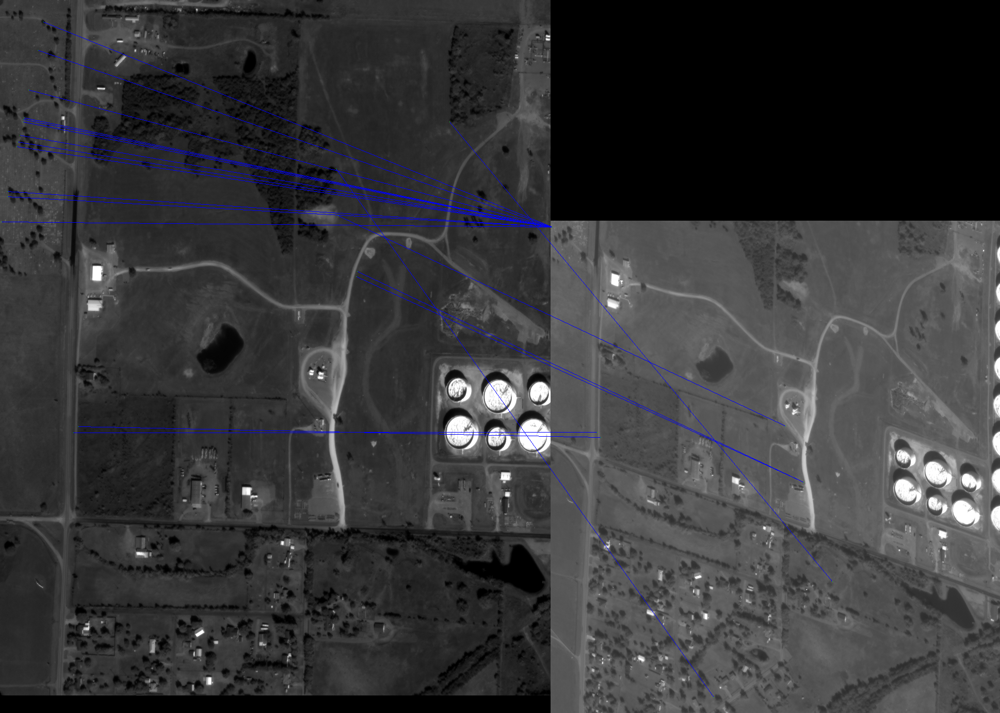

In [9]:
from IPython.display import Image
filename = "output/tiles/row_0000000_height_1349/col_0000000_width_1067/pair_1/" + 'sift_matches_pointing.png'
Image(filename=filename) 

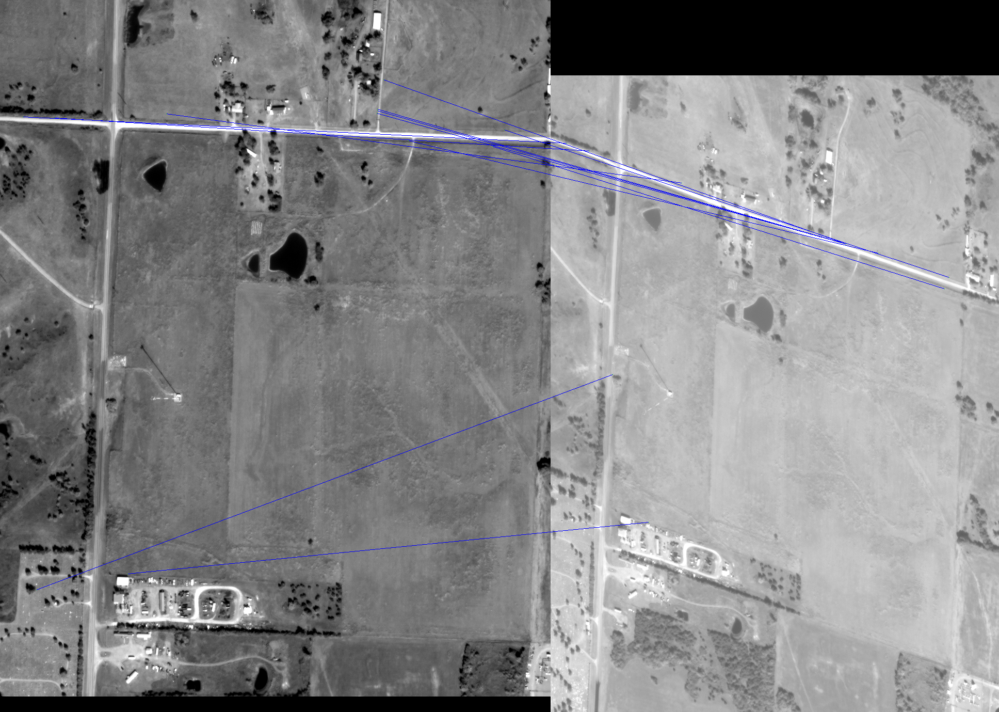

In [38]:
from IPython.display import Image
filename = "output/tiles/row_0000000_height_1349/col_0000000_width_1067/pair_1/" + 'sift_matches_pointing.png'
Image(filename=filename) 

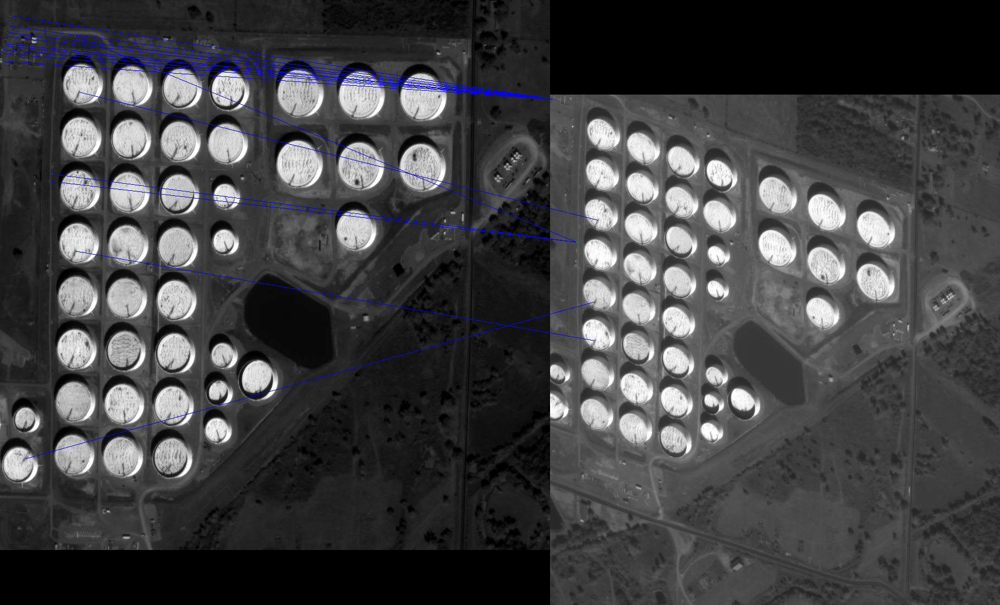

In [47]:
from IPython.display import Image
filename = "output/tiles/row_0000000_height_1000/col_0001000_width_1000/pair_1/sift_matches_pointing.png"
Image(filename=filename) 

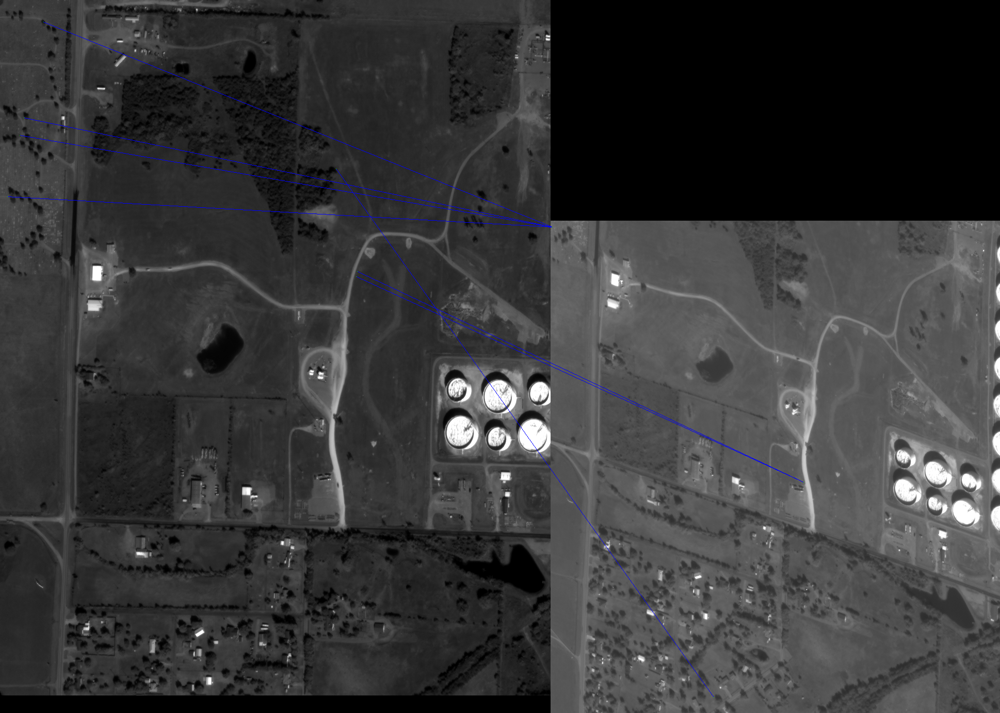

In [44]:
from IPython.display import Image
filename = "carlo/sift_d2_0009/tiles/row_0000000_height_1349/col_0000000_width_1067/pair_1/sift_matches_disp.png"
Image(filename=filename) 

# Video

In [5]:
RELATIVE_PATH = "../data/"
# Video
VIDEO = RELATIVE_PATH + "s02_20150507T020554Z/*"
# n_uplet
n_uplet = RELATIVE_PATH + "s03_20161003T16*/"
n_uplet_panchromatic = n_uplet + "panchromatic/"
n_uplet_pansharp = n_uplet + "pansharp/*"

roi = {
    "x": 1000,
    "y": 400,
    "w": 500,
    "h": 500
}
x, y, w, h = roi["x"], roi["y"], roi["w"], roi["h"]

In [6]:
video_tif = glob(VIDEO + "*/*.tif")
video_tif.sort()

In [7]:
matches_on_rpc_aoi

NameError: name 'matches_on_rpc_aoi' is not defined